<center><font face='Georgia'> 

# Traitement d'images. 

    
<center><font size=5 color ='grey' > <i><b>Compte Rendu TP3<b></i> : Filtrage spatial  </center></font>
                 
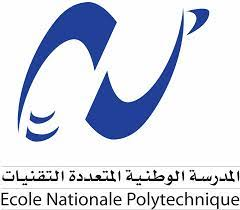


------



> **Fait par :**
<font color ='darkblue' face='Georgia' >    
 1.OUCHENE Souhil.  
 2.TOUATI Islem.
</font>
    
> **Janvier 2023**
    



In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning) 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import cv2 as cv
from PIL import Image
import math

# Manip1:

## Lecture et affichage de l'image:

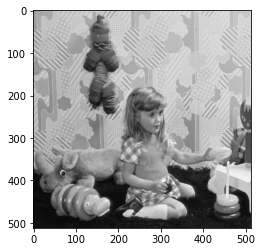

In [2]:
image = Image.open('isabelle.bmp')
plt.imshow(image, cmap = "gray")
plt.show()

Obtenons maintenant la matrice de l'image:

In [3]:
image_matrice = np.asarray(image)

## Creation et l'ajout du bruit guassien :

In [4]:
#On cree un bruit guassien avec une moyenne nulle et un ecart type = 0.1
matrice_shape = image_matrice.shape
moyenne = 0
ecart_type = 0.1
bruit =  np.random.normal(moyenne , ecart_type , size=(matrice_shape[0] , matrice_shape[1]))
#L'ajout du bruit a la matrice :
image_bruit_matrice = image_matrice + bruit*255

## Affichage de l'image originale et l'image bruitee :

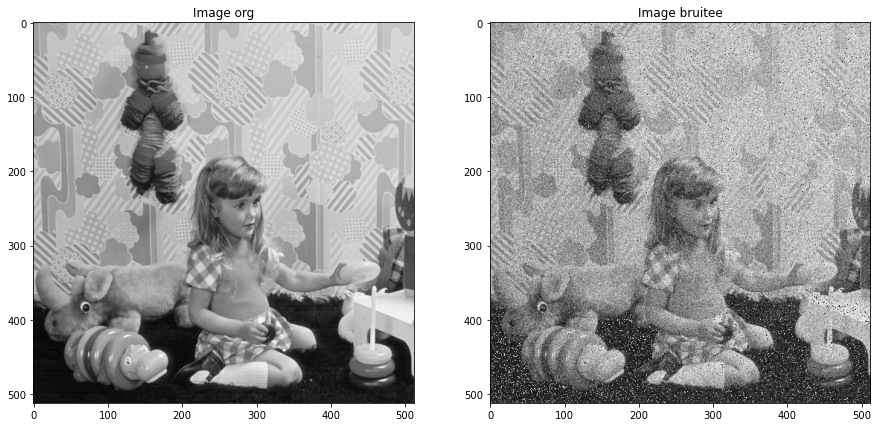

In [5]:
image_bruit = np.uint8(image_bruit_matrice)
#Affichage

fig=plt.figure(figsize=(15, 15))
fig.add_subplot(1,2,1)
plt.title("Image org")
plt.imshow(image, cmap = "gray")

fig.add_subplot(1,2,2)
plt.title("Image bruitee")
plt.imshow(image_bruit, cmap = "gray")
plt.show()

Dans ce qui suit, on va appliquer des filtres a cet image bruites :

## Filtre moyenneur:

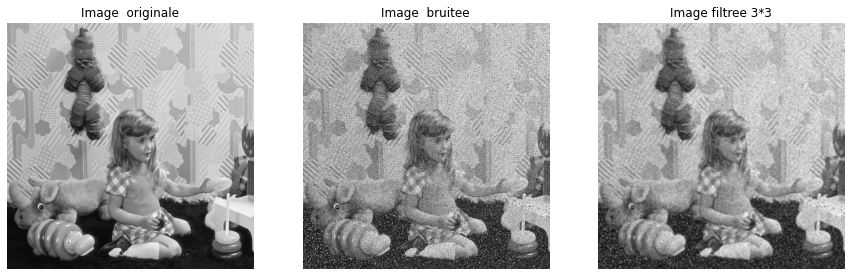

In [6]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit, size)

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,3,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree 3*3")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

plt.show()

## Calcul de taille de l'image :

In [7]:
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

la taille de l'image apres filtrage :  512 * 512


## Commentaires :

Les filtres moyenneurs sont utilisés pour lisser (supprimer le bruit avec un ajout de flou) en remplaçant la valeur de chaque pixel central par la valeur moyenne des pixels du voisinage.
- La taille de l'image resultante est la meme que la taille originale.
- Lors de l'application sur un bruit gaussien(bruit aléatoire avec une distribution normale), le filtre de moyenneur réduit le niveau de bruit global avec un grand floutage : il en résulte une image plus lisse avec moins de bruit, mais aussi une perte de détails et de bords fins (on effectue par defaut un zero padding : bordure noire).

On a d'autres types de padding pour traiter les bordures :
- cv.BORDER_CONSTANT : Ce type de remplissage définit une valeur constante pour les pixels de la bordure. Il s'agit de la méthode de remplissage par défaut dans OpenCV.
- cv.BORDER_REPLICATE : Ce type de remplissage reproduit les pixels de bordure de l'image.
- cv.BORDER_REFLECT : Ce type de remplissage reflète les pixels du bord de l'image à travers le bord.
- cv.BORDER_WRAP : Ce type de remplissage enroule les pixels de bordure de l'image autour du côté opposé de l'image.
- cv.BORDER_REFLECT_101 : Ce type de remplissage reflète les pixels de bordure de l'image à travers la bordure, avec les pixels de bordure répliqués pour le premier et le dernier pixel.
- cv.BORDER_CONSTANT : Ce type de remplissage est utilisé pour ajouter une valeur constante aux pixels de la bordure. La valeur constante peut être passée comme argument à la fonction.

Dans la cellule suivante on va essayer l'effet mirroir comme suit :

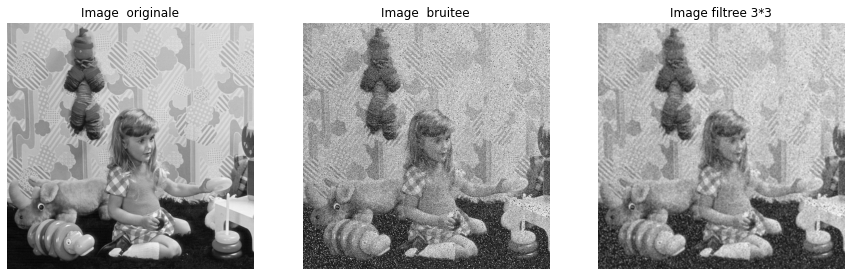

In [8]:
# Preciser le type de bordure comme mirroir
Type_bordure = cv.BORDER_REFLECT

# Apply the blur to the image with a reflected border
img_blurred = cv.blur(image_bruit, size, borderType=Type_bordure)

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,3,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree 3*3")
plt.imshow(img_blurred, cmap = "gray")
plt.axis('off')

plt.show()

## Commentaires:
- En utilisant cv2.BORDER_CONSTANT, une valeur constante (0 dans le cas de 0-padding) est utilisée pour les pixels de la bordure. La valeur constante est utilisée pour remplir la bordure de l'image, ce qui signifie que les pixels de la bordure seront remplacés par la même valeur constante.
- D'autre part, cv2.BORDER_REFLECT reflète les pixels de la bordure à travers la bordure. Cela signifie que le premier et le dernier pixel seront reflétés pour créer la bordure. Par exemple, si le pixel du coin supérieur gauche est (255, 0, 0) (couleur bleue), les pixels de la bordure supérieure seront également (255, 0, 0).
- En general lorsqu'on utilise un filtre moyenneur, la méthode cv2.BORDER_CONSTANT peut être utile si on cherche a ajouter une bordure de couleur unie à votre image. D'autre part, la méthode cv2.BORDER_REFLECT peut être utile si on veut maintenir la continuité de l'image, surtout si l'image a des caractéristiques importantes autour de la bordure.

## La soustraction :

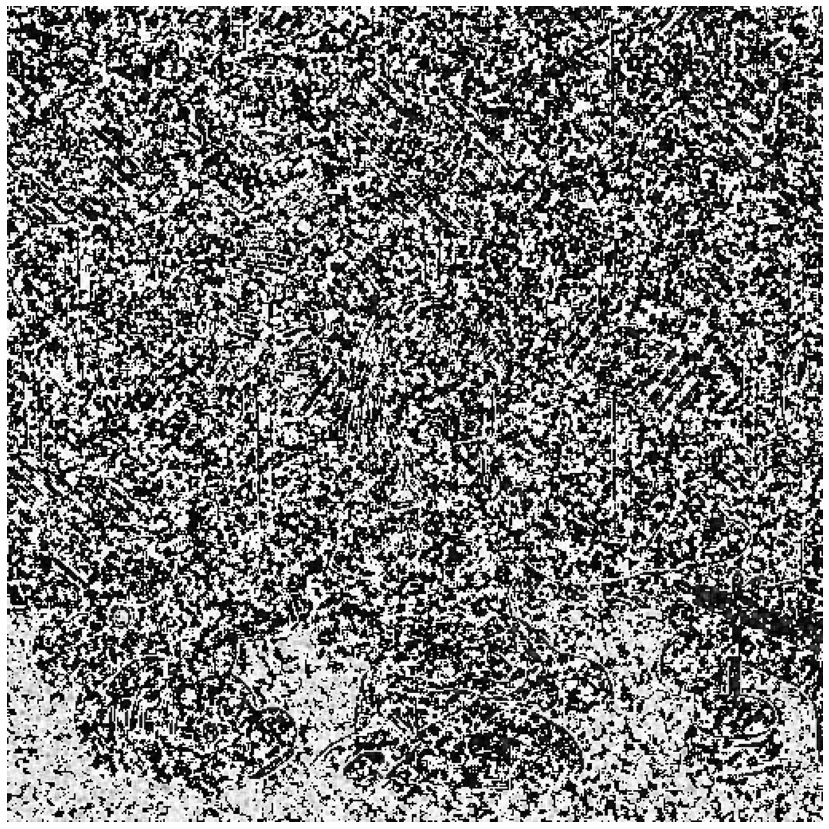

In [9]:
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
#Affichage
fig=plt.figure(figsize=(15, 15))
image_sous = np.uint8(image_sous_mat)
plt.imshow(image_sous, cmap = 'gray')
plt.axis('off')
plt.show()

## Commentaires:
Le resultat obtenu confirme ce qu'on trouve avant:
- le filtre moyenneur diminue le bruit avec un ajout du flou qui fait perdre le details de l'image (contours non visibles)

On refait le meme travail avec des filtres 5 * 5, 6 * 6 et 7 * 7 :

# CAS 5*5 :

la taille de l'image apres filtrage :  512 * 512


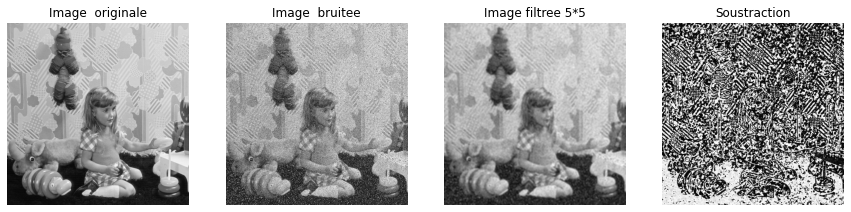

In [10]:
# On definit d'abord la taille du masque :
size = (5, 5)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit, size)
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image filtree 5*5")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')

plt.show()

# CAS 6*6

la taille de l'image apres filtrage :  512 * 512


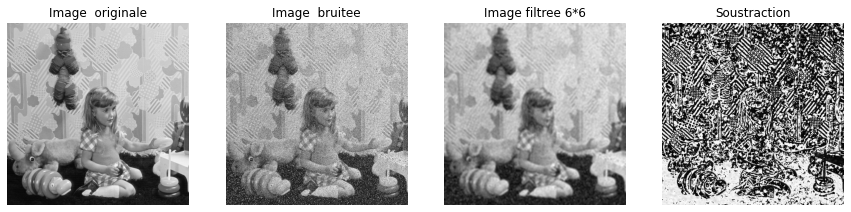

In [11]:
# On definit d'abord la taille du masque :
size = (6, 6)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit, size)
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image filtree 6*6")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')

plt.show()

# CAS 7*7 :

la taille de l'image apres filtrage :  512 * 512


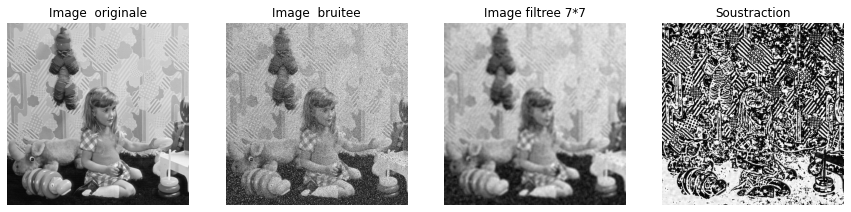

In [12]:
# On definit d'abord la taille du masque :
size = (7, 7)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit, size)
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image filtree 7*7")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')

plt.show()

## Commentaires et conclusions :

- La taille du masque n'influe pas sur la taille de l'image resultante, on aura toujours une image filtree de meme taille que l'image originale.
- Une augmentation du taille du filtre induit une grande reduction de bruit associee avec un grand flou et elimination de details de l'image --> contours supprimes (On peut confirmer des images de differences).
- Le filtre moyenneur est un filtre passe-bas qui permet un passage des petites frequences (les contours et le bruits sont des hautes frequences).

## Filtre gaussien:

On va commencer avec le masque 3 * 3 et un ecart type de 1

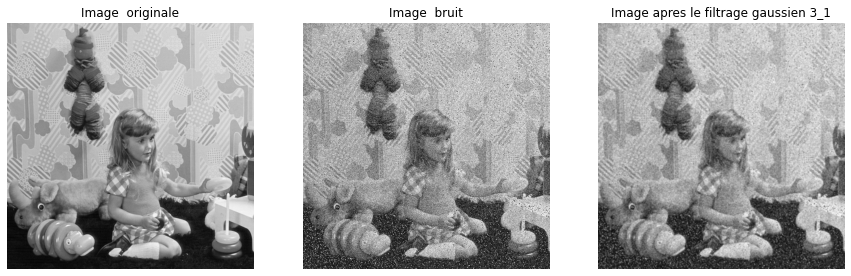

In [13]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_1 = cv.GaussianBlur(image_bruit, size ,1 )
#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image apres le filtrage gaussien 3_1")
plt.imshow(image_fil_gaussien_3_1, cmap = "gray")
plt.axis('off')

plt.show()

## Commentaires : 
- Le filtre gaussien est le mieux adapte a ce bruit(Gaussien) : son masque est constitue d'une guassienne descritisee.
- On a moins de flou avec un max de suppression de bruit (ceci depend bien sur de la taille du filtre d et l'ecart type).



## Influence de la taille du masque et l'ecart type:
Dans ce qui suit on va essayer des combinaisons de filtres selon la taille et l'ecart type :

la taille de l'image apres filtrage :  512 * 512


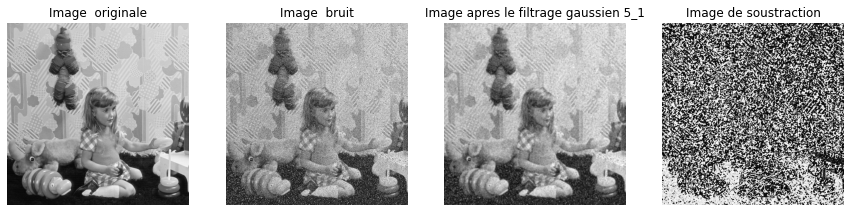

In [14]:
# On definit d'abord la taille du masque :
size = (5, 5)
  
# On utilise la fonction cv.blur
image_fil_gaussien_5_1 = cv.GaussianBlur(image_bruit, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_5_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_5_1.shape[0], "*",  image_fil_gaussien_5_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 5_1")
plt.imshow(image_fil_gaussien_5_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


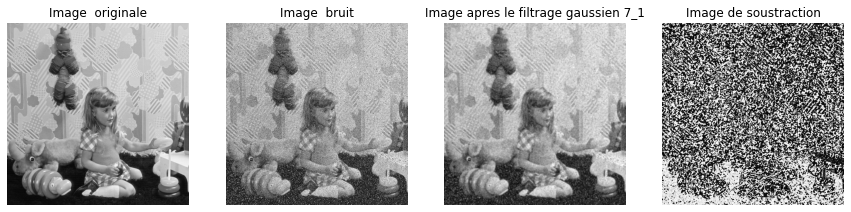

In [15]:
# On definit d'abord la taille du masque :
size = (7, 7)
  
# On utilise la fonction cv.blur
image_fil_gaussien_7_1 = cv.GaussianBlur(image_bruit, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_7_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_7_1.shape[0], "*",  image_fil_gaussien_7_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 7_1")
plt.imshow(image_fil_gaussien_7_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


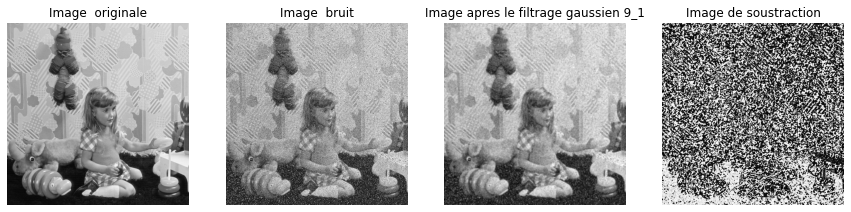

In [16]:
# On definit d'abord la taille du masque :
size = (9, 9)
  
# On utilise la fonction cv.blur
image_fil_gaussien_9_1 = cv.GaussianBlur(image_bruit, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_9_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_9_1.shape[0], "*",  image_fil_gaussien_9_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 9_1")
plt.imshow(image_fil_gaussien_9_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

Dans ce qui precede, on fixer l'ecart type a 1, et on fait varier la taille du masque de 3 * 3 a 9 * 9, changons maintenant l'ecart type en fixant la taille a 3 * 3 :

la taille de l'image apres filtrage :  512 * 512


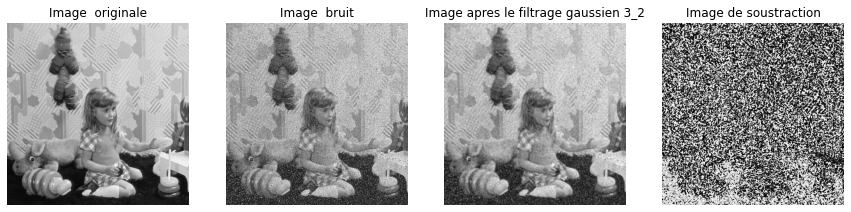

In [17]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_2 = cv.GaussianBlur(image_bruit, size ,2 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_2
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_2.shape[0], "*",  image_fil_gaussien_3_2.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_2")
plt.imshow(image_fil_gaussien_3_2, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


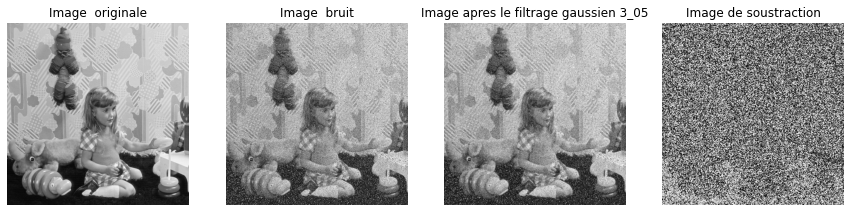

In [18]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_05 = cv.GaussianBlur(image_bruit, size ,0.5 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_05
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_05.shape[0], "*",  image_fil_gaussien_3_05.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_05")
plt.imshow(image_fil_gaussien_3_05, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


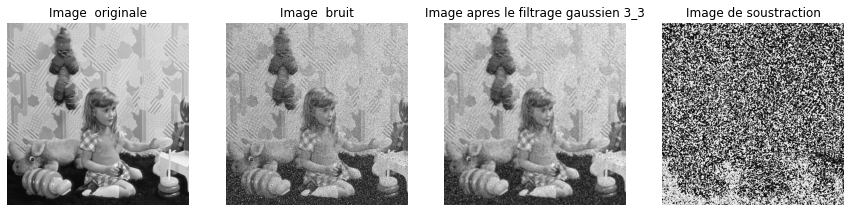

In [19]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_3 = cv.GaussianBlur(image_bruit, size ,3 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_3
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_3.shape[0], "*",  image_fil_gaussien_3_3.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_3")
plt.imshow(image_fil_gaussien_3_3, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

## Commentaires :
- Il existe un influence de la taille du masque et l'ecart type sur le resultat obtenu.
- Il existe aussi une relation de correlation directe entre la taille du masque et l'ecart type : si on augmente d ou sigma, il faut augmenter l'autre parametre pour avoir les mieux resultats possibles(elimination maximale de bruit avec une preservation de contours) : ceci est confirme avec la relation vu au cours (Cas ideal d = 6 * sigma + 1)
- En pratique, on a trouve que le masque 3 * 3 avec sigma = 1 et le meilleure masque a utiliser.

Dans ce qui suit on va effectuer la soustraction pour les sigmas = 1 et les masque 3 * 3 et 7 * 7:



la taille de l'image apres filtrage :  512 * 512


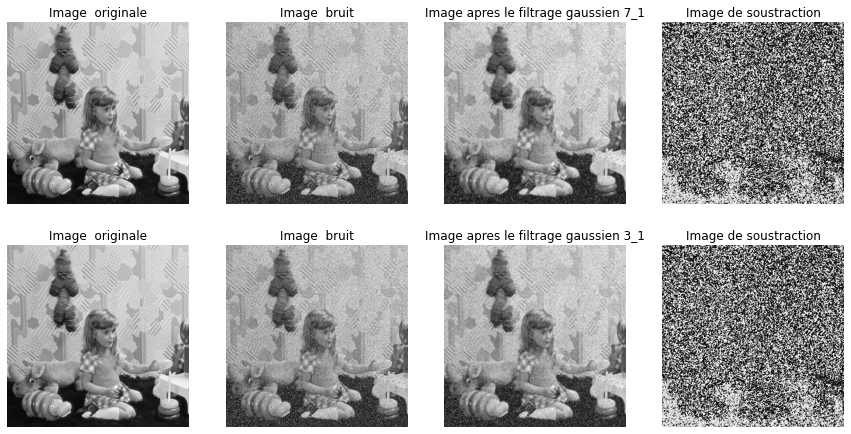

In [20]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_1 = cv.GaussianBlur(image_bruit, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_1.shape[0], "*",  image_fil_gaussien_3_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_1")
plt.imshow(image_fil_gaussien_3_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')


fig.add_subplot(2,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(2,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,3)
plt.title("Image apres le filtrage gaussien 7_1")
plt.imshow(image_fil_gaussien_7_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

## Commentaires:
la soustraction dans les 2 cas nous permet de supprimer le bruit seulement sans eliminer des details (les filtres sont bons).

En general, il est difficile de déterminer le meilleur masque pour ce type de bruit sans informations supplémentaires sur l'image ou l'application spécifique, mais on peut avoir les resultats suivants :
- un masque gaussien avec une taille de noyau plus petite et un écart-type plus faible sera plus efficace pour supprimer le bruit avec des détails fins.
- Une taille de noyau plus grande et un écart-type plus élevé seront mieux adaptés pour supprimer le bruit avec des caractéristiques plus grossières.

En fin de compte, le meilleur masque dépendra des caractéristiques spécifiques du bruit et du niveau souhaité de préservation des détails dans l'image finale.

## Filtre median:

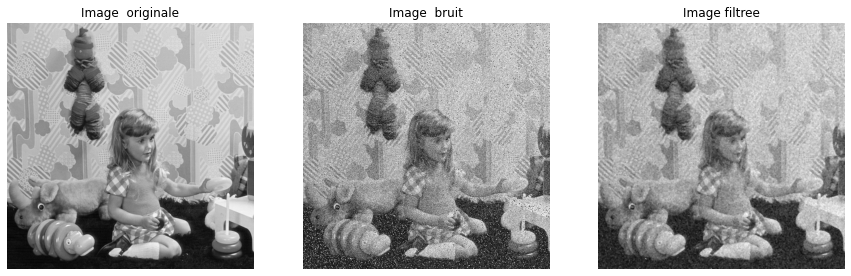

In [21]:
#On va commencer par la construction du filtre : 3*3
image_fil_median_3 = cv.medianBlur(image_bruit, 3)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_3, cmap = "gray")
plt.axis('off')

plt.show()

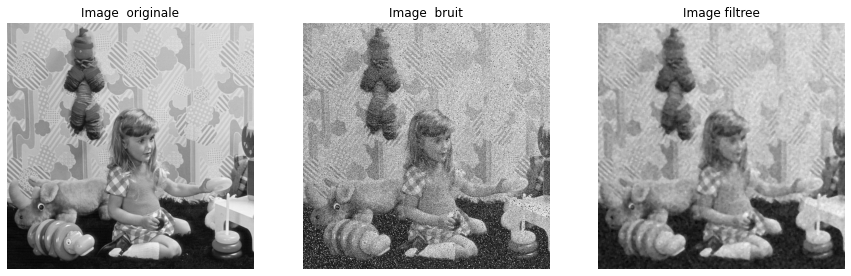

In [22]:
#On va commencer par la construction du filtre :5*5
image_fil_median_5 = cv.medianBlur(image_bruit, 5)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_5, cmap = "gray")
plt.axis('off')

plt.show()

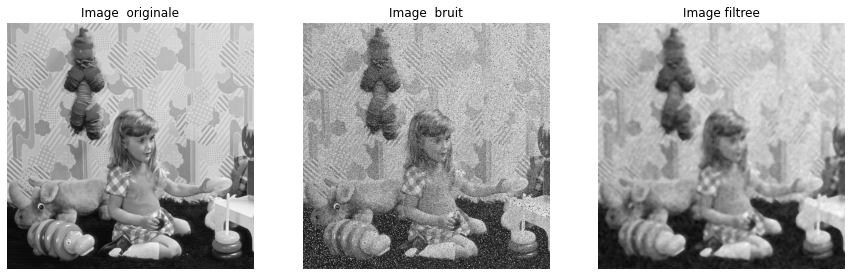

In [23]:
#On va commencer par la construction du filtre :7*7
image_fil_median_7 = cv.medianBlur(image_bruit, 7)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_7, cmap = "gray")
plt.axis('off')

plt.show()

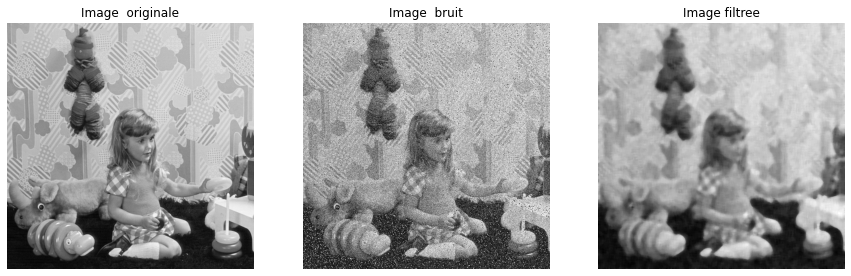

In [24]:
#On va commencer par la construction du filtre :9*9
image_fil_median_9 = cv.medianBlur(image_bruit, 9)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_9, cmap = "gray")
plt.axis('off')

plt.show()

## Comparaison et conclusion:

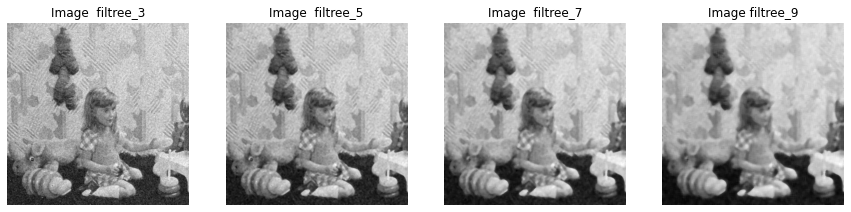

In [25]:
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  filtree_3")
plt.imshow(image_fil_median_3, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  filtree_5")
plt.imshow(image_fil_median_5, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image  filtree_7")
plt.imshow(image_fil_median_7, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image filtree_9")
plt.imshow(image_fil_median_9, cmap = "gray")
plt.axis('off')
plt.show()

On peut bien remarquer que pour chaque augmentation dans la taille du filtre, la quantite du flou augmente.
- Ces filtres median calculent une mediane du px de voisinage, c'est un filtre passe bas non lineair
- Le bruit est supprime avec une grande taille du masque qui cause un grand floutage.

--> La meilleure taille est de 3 * 3, qu'on va prendre dans la soustraction :

la taille de l'image apres filtrage :  512 * 512


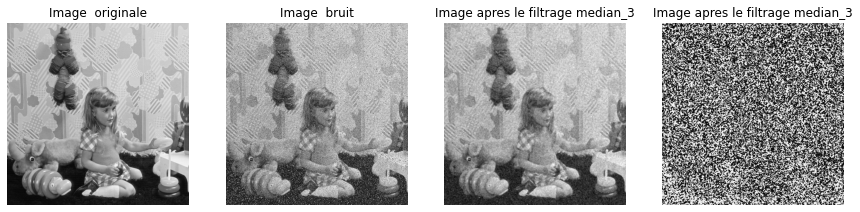

In [26]:
image_sous_mat = image - image_fil_median_3
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_median_3.shape[0], "*",  image_fil_median_3.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage median_3")
plt.imshow(image_fil_median_3, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image apres le filtrage median_3")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')


plt.show()

## Conclusion :
Le filtre median n'est pas le meilleur a utiliser contre le bruit gaussien.

## Comparaison des trois filtres Vs bruit gaussien :
On a 2 types de filtres:
- des filtres lineaires(de convolution): filtres gaussien et moyenneur.
- filtres non lineaires : median.

On a alors:
- Le filtre moyenneur : Ce filtre remplace chaque pixel de l'image par la valeur moyenne des pixels de son voisinage. Il est simple à mettre en œuvre et peut être efficace pour éliminer le bruit gaussien, mais il a également tendance à rendre les bords de l'image flous. (la taille min est la meilleure)

- Filtre flou gaussien : Ce filtre utilise un noyau gaussien pour lisser l'image. Il est similaire au filtre moyenneur, mais il donne plus de poids aux pixels plus proches du centre du noyau, ce qui entraîne un flou moindre des bords. (en pratique 3*3 et le meilleur avec sigma = 1). Il permet ainsi de réaliser un lissage et donc debruitage de l’image, avec une meilleure conservation des contours que le filtre moyenneur.

- Filtre median : Ce filtre remplace chaque pixel de l'image par la valeur mediane des pixels de son voisinage. Il n'est pas conseille de l'utiliser pour le bruit gaussien suaf pour le pretraitrement car il a pour effet secondaire de rendre les bords flous.

Le filtre le plus adapté au bruit gaussien est donc le filtre gaussien, il elimine le bruit et floute que peut l’image.

## Creation et l'ajout du bruit impulsionnel (Poivre et sel) :

On va utiliser la fonction definie dans le fascicule :

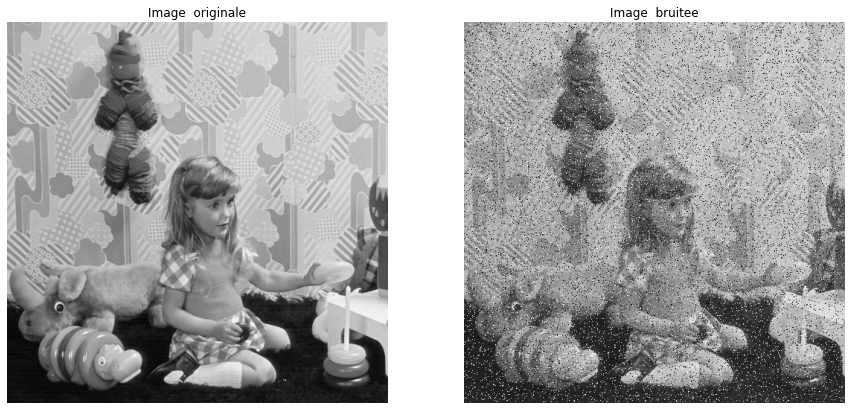

In [27]:
# definition de la fonction : 
def impulse(img,amount):
    row,col = img.shape
    s_vs_p = 0.5
    out = np.copy(img)
    # Salt mode
    num_salt = np.ceil(amount * img.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in img.shape]
    out[coords] = 255
    # Pepper mode
    num_pepper = np.ceil(amount* img.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in img.shape]
    out[coords] = 0
    return out
# On va prendre un bruit impulsionnel avec une probabilite = 0.1
image_bruit_impulsionnel_matrice = impulse(image_matrice , 0.1)
image_bruit_impulsionnel = np.uint8(image_bruit_impulsionnel_matrice)
#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,2,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,2,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')
plt.show()

Dans ce qui suit, on va utiliser les differents types filtres :

## Filtre Moyenneur :

On doit re-appliquer les memes etapes comme dans la premiere partie :

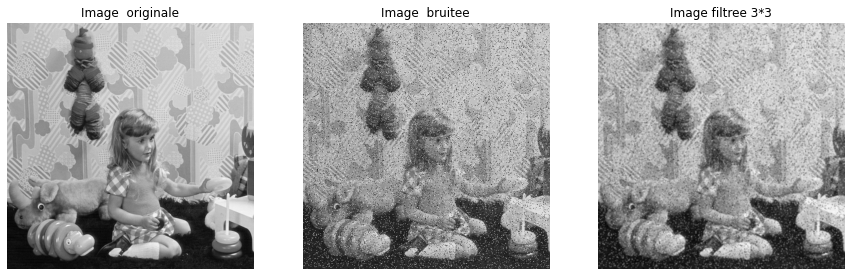

In [28]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit_impulsionnel, size)

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,3,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree 3*3")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

plt.show()

On continue avec des filtres de taille 5 * 5, 6 * 6 et 7 * 7 :

la taille de l'image apres filtrage :  512 * 512


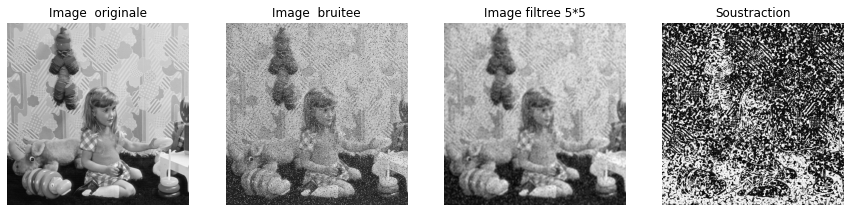

In [29]:
# On definit d'abord la taille du masque :
size = (5, 5)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit_impulsionnel, size)
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image filtree 5*5")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')

plt.show()

la taille de l'image apres filtrage :  512 * 512


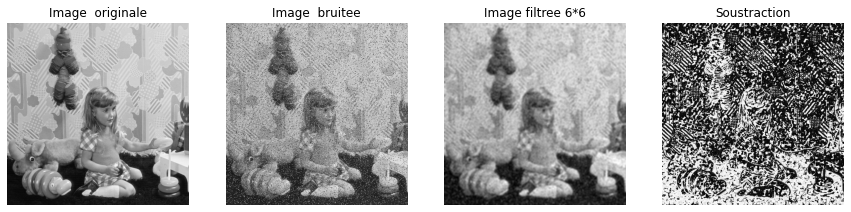

In [30]:
# On definit d'abord la taille du masque :
size = (6, 6)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit_impulsionnel, size)
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image filtree 6*6")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')

plt.show()

la taille de l'image apres filtrage :  512 * 512


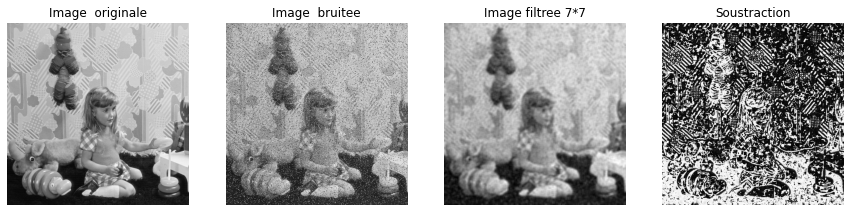

In [31]:
# On definit d'abord la taille du masque :
size = (7, 7)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit_impulsionnel, size)
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image filtree 7*7")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')

plt.show()

## Comparaisons et commentaires :
- Les filtres moyenneurs peuvent être utilisés pour éliminer le bruit impulsionnel, également connu sous le nom de bruit "sel et poivre", des images. 
- La taille du noyau, ou la taille du voisinage utilisé pour calculer la valeur moyenne d'un pixel, est un paramètre important lors de l'utilisation d'un filtre moyenneur pour la réduction du bruit impulsionnel.
- Une taille de noyau de 3x3 est un choix courant pour la suppression du bruit impulsionnel, car elle est suffisamment petite pour préserver les détails fins de l'image, mais suffisamment grande pour éliminer efficacement le bruit. Une taille de noyau de 5x5 ou 7x7 peut également être utilisée, mais ces tailles de noyau plus grandes peuvent entraîner un plus grand flou de l'image.
- Lorsque la taille du noyau est augmentée, le filtre aura un effet plus lissant sur l'image, et il éliminera plus de bruit mais l'image apparaîtra plus floue.(Dans notre cas le meilleur masque est de taille 3*3)
- les masque gardent toujours les memes dimensions pour l'image du resultat.
- Il est important de tester différentes tailles de noyau et différents réglages pour trouver le meilleur filtre de moyennage pour une image spécifique avec un bruit impulsionnel. Le compromis entre la réduction du bruit et la préservation des détails peut être évalué à l'aide des mesures PSNR (Peak signal-to-noise ratio) ou MSE (Mean Square Error) : googlee.

On va afficher le resultat obtenu avec le masque 3*3 : (Pour confirmer nos resultats : moins de details dans l'image de soustraction).

la taille de l'image apres filtrage :  512 * 512


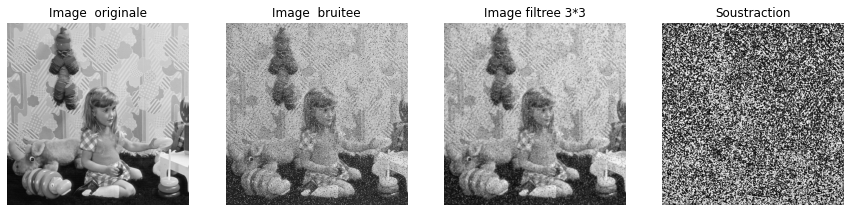

In [32]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_moyenneur = cv.blur(image_bruit_impulsionnel, size)
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_moyenneur
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_moyenneur.shape[0], "*",  image_fil_moyenneur.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruitee")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image filtree 3*3")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')

plt.show()

## Filtre Gaussien :

De la meme maniere, on va d'abord fixer l'ecart type sigma a 1 et varier la taille du masque, et puis faire l'inverse :

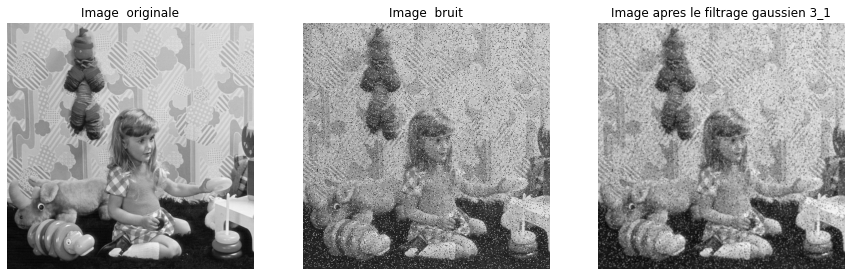

In [33]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_1 = cv.GaussianBlur(image_bruit_impulsionnel, size ,1 )
#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image apres le filtrage gaussien 3_1")
plt.imshow(image_fil_gaussien_3_1, cmap = "gray")
plt.axis('off')

plt.show()

la taille de l'image apres filtrage :  512 * 512


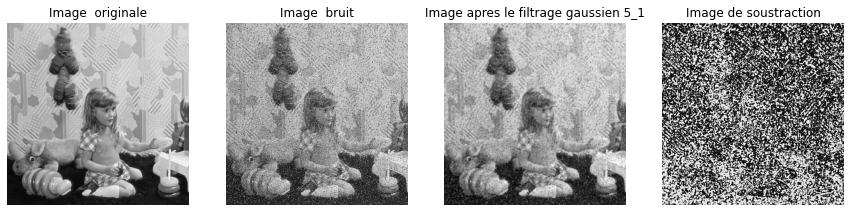

In [34]:
# On definit d'abord la taille du masque :
size = (5, 5)
  
# On utilise la fonction cv.blur
image_fil_gaussien_5_1 = cv.GaussianBlur(image_bruit_impulsionnel, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_5_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_5_1.shape[0], "*",  image_fil_gaussien_5_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 5_1")
plt.imshow(image_fil_gaussien_5_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


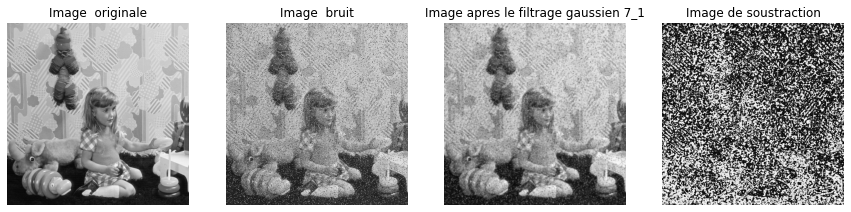

In [35]:
# On definit d'abord la taille du masque :
size = (7, 7)
  
# On utilise la fonction cv.blur
image_fil_gaussien_7_1 = cv.GaussianBlur(image_bruit_impulsionnel, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_7_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_7_1.shape[0], "*",  image_fil_gaussien_7_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 7_1")
plt.imshow(image_fil_gaussien_7_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


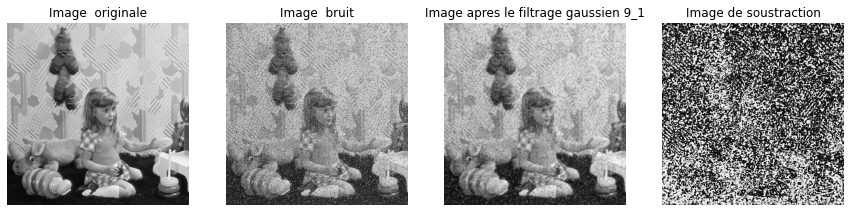

In [36]:
# On definit d'abord la taille du masque :
size = (9, 9)
  
# On utilise la fonction cv.blur
image_fil_gaussien_9_1 = cv.GaussianBlur(image_bruit_impulsionnel, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_9_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_9_1.shape[0], "*",  image_fil_gaussien_9_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 9_1")
plt.imshow(image_fil_gaussien_9_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

Maintenant, in va faire l'inverse, cad : fixer la taille du masque 3 * 3 et varier le sigma :

la taille de l'image apres filtrage :  512 * 512


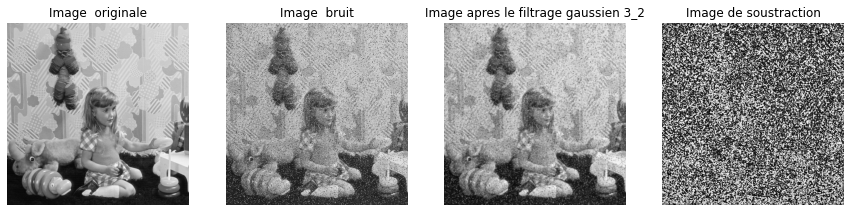

In [37]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_2 = cv.GaussianBlur(image_bruit_impulsionnel, size ,2 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_2
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_2.shape[0], "*",  image_fil_gaussien_3_2.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_2")
plt.imshow(image_fil_gaussien_3_2, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


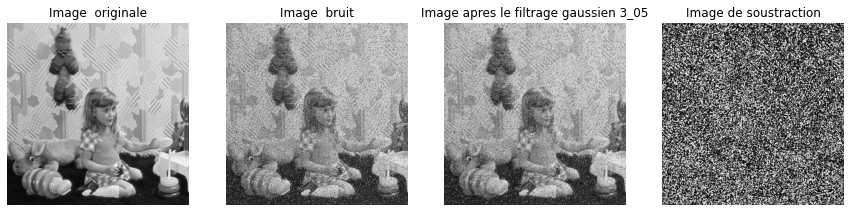

In [38]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_05 = cv.GaussianBlur(image_bruit_impulsionnel, size ,0.5 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_05
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_05.shape[0], "*",  image_fil_gaussien_3_05.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_05")
plt.imshow(image_fil_gaussien_3_05, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


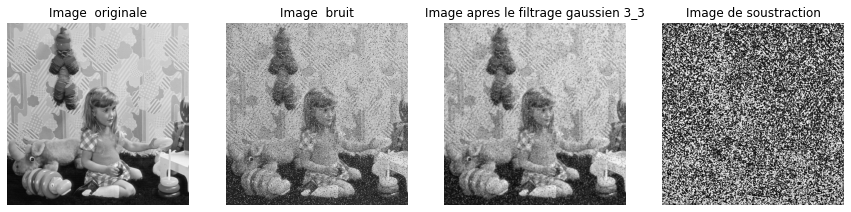

In [39]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_3 = cv.GaussianBlur(image_bruit_impulsionnel, size ,3 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_3
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_3.shape[0], "*",  image_fil_gaussien_3_3.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_3")
plt.imshow(image_fil_gaussien_3_3, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')
plt.show()

la taille de l'image apres filtrage :  512 * 512


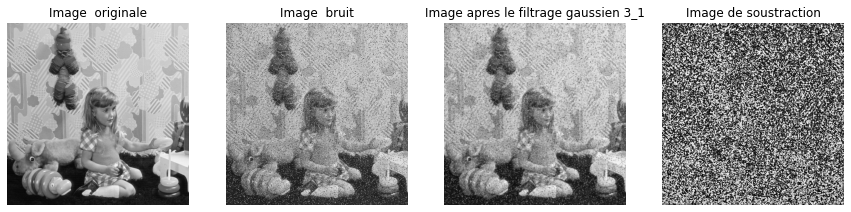

In [40]:
# On definit d'abord la taille du masque :
size = (3, 3)
  
# On utilise la fonction cv.blur
image_fil_gaussien_3_1 = cv.GaussianBlur(image_bruit_impulsionnel, size ,1 )
#On definit la matrice de soustraction :
image_sous_mat = image - image_fil_gaussien_3_1
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_gaussien_3_1.shape[0], "*",  image_fil_gaussien_3_1.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')



fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_1")
plt.imshow(image_fil_gaussien_3_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image de soustraction")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off') 
plt.show()

## Commentaires et Conclusion :
L'ecart-type et la taille du noyau d'un filtre gaussien ont tous deux un impact sur sa capacite a eliminer le bruit poivre et sel d'une image :

- ecart-type : Un ecart-type plus important se traduit par un noyau de filtre plus large et un effet de lissage plus étendu. Avec un ecart-type plus important, le filtre gaussien fera la moyenne d'un plus grand nombre de pixels, ce qui peut donner une image plus floue mais aussi une suppression plus efficace du bruit.

- Taille du noyau : Plus la taille du noyau est grande, plus le nombre de pixels pris en compte dans le calcul de la moyenne est élevé, ce qui permet un lissage plus important. Cependant, une taille de noyau plus grande rend également le filtre plus lent à appliquer et peut entraîner un lissage excessif, provoquant une perte d'information.

En résumé, il faut trouver un équilibre entre l'écart-type et la taille du noyau pour éliminer efficacement le bruit poivre et sel tout en préservant les détails importants de l'image.(dans notre cas c'est le filtre gaussien de taille 3*3 et ecart type 1 ) : ceci ne signifie pas qu'il est le meilleur filtre pour ce bruit.


## Filtre median :
Dans cette partie on va esseayer d'utiliser le filtre median avec differentes tailles de masque : 3,5,7 et 9

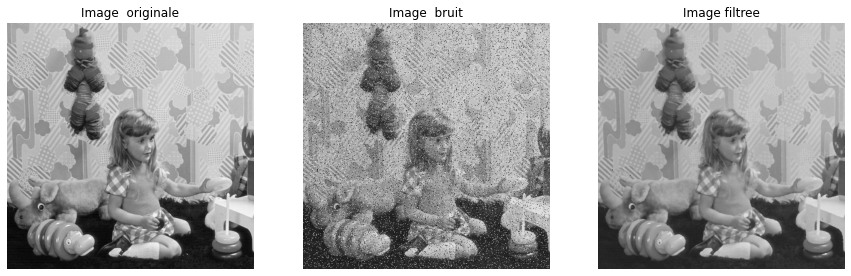

In [41]:
#On va commencer par la construction du filtre : 3*3
image_fil_median_3 = cv.medianBlur(image_bruit_impulsionnel, 3)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_3, cmap = "gray")
plt.axis('off')

plt.show()

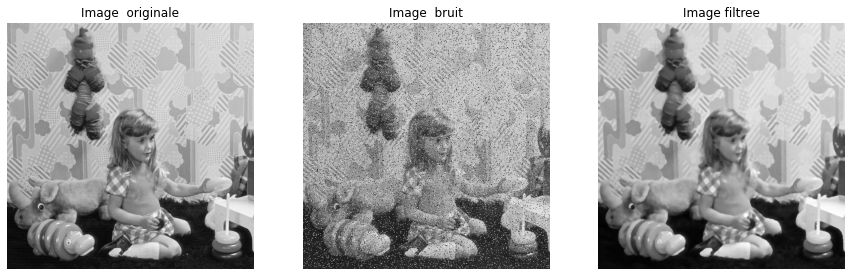

In [42]:
#On va commencer par la construction du filtre :5*5
image_fil_median_5 = cv.medianBlur(image_bruit_impulsionnel, 5)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_5, cmap = "gray")
plt.axis('off')

plt.show()

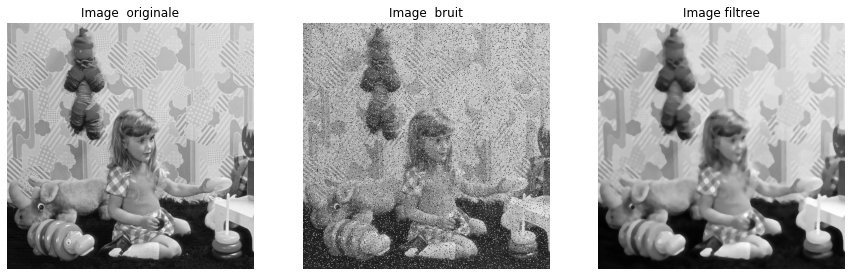

In [43]:
#On va commencer par la construction du filtre :7*7
image_fil_median_7 = cv.medianBlur(image_bruit_impulsionnel, 7)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_7, cmap = "gray")
plt.axis('off')

plt.show()

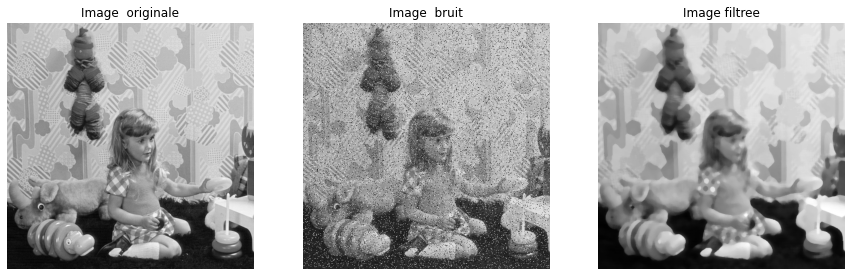

In [44]:
#On va commencer par la construction du filtre :9*9
image_fil_median_9 = cv.medianBlur(image_bruit_impulsionnel, 9)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,3,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("Image filtree")
plt.imshow(image_fil_median_9, cmap = "gray")
plt.axis('off')

plt.show()

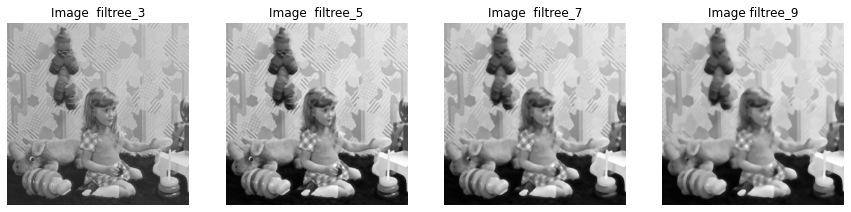

In [45]:
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  filtree_3")
plt.imshow(image_fil_median_3, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  filtree_5")
plt.imshow(image_fil_median_5, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image  filtree_7")
plt.imshow(image_fil_median_7, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image filtree_9")
plt.imshow(image_fil_median_9, cmap = "gray")
plt.axis('off')
plt.show()

## Comparaison entre filtres median de differentes tailles :
La taille du noyau affecte le résultat du filtrage de la manière suivante :

- Une taille de noyau plus importante (par exemple 9) entraîne un effet de lissage plus fort, mais rend également plus flous les détails d'origine.

- Une taille de noyau plus petite (3, par exemple) produit un effet de lissage plus faible, mais préserve davantage les détails originaux.

Le choix de la taille du noyau dépend de l'équilibre souhaité entre le lissage du bruit et la préservation des détails.
Pour une image de bruit poivre et sel, l'utilisation d'une taille de noyau plus grande produira généralement un meilleur effet de lissage, mais avec un risque plus élevé de brouiller les détails importants. Le choix de la taille du noyau est un compromis entre la réduction du bruit et la préservation des détails.


On va alors choisir le filtre median de taille 3*3 qui nous donne une bonne qualite d'image(moins de bruit + peu de flou), comme suit :

la taille de l'image apres filtrage :  512 * 512


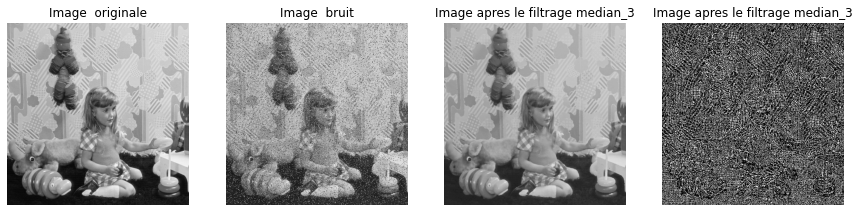

In [46]:
image_sous_mat = image - image_fil_median_3
image_sous = np.uint8(image_sous_mat)
print("la taille de l'image apres filtrage : ", image_fil_median_3.shape[0], "*",  image_fil_median_3.shape[1])

#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage median_3")
plt.imshow(image_fil_median_3, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image apres le filtrage median_3")
plt.imshow(image_sous, cmap = "gray")
plt.axis('off')


plt.show()

## Comparaison des trois filtres Vs bruit impulsionnel :

Pour se faire, on doit afficher les images obtenues pour chaque filtre avec la taille 3*3, ainsi que leurs differences :

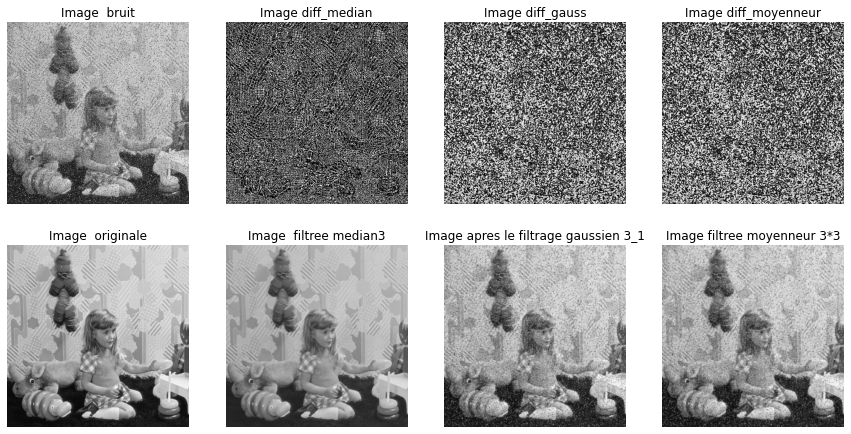

In [47]:
image_sous_mat1 = image - image_fil_median_3
image_sous1 = np.uint8(image_sous_mat1)

image_sous_mat2 = image - image_fil_gaussien_3_1
image_sous2 = np.uint8(image_sous_mat2)

image_sous_mat3 = image - image_fil_moyenneur
image_sous3 = np.uint8(image_sous_mat3)



#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  filtree median3")
plt.imshow(image_fil_median_3, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image apres le filtrage gaussien 3_1")
plt.imshow(image_fil_gaussien_3_1, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image filtree moyenneur 3*3")
plt.imshow(image_fil_moyenneur, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,1)
plt.title("Image  bruit")
plt.imshow(image_bruit_impulsionnel, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,2)
plt.title("Image diff_median")
plt.imshow(image_sous1, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,3)
plt.title("Image diff_gauss")
plt.imshow(image_sous2, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,4)
plt.title("Image diff_moyenneur")
plt.imshow(image_sous3, cmap = "gray")
plt.axis('off')

plt.show()


## Commentaires et conclusion :

L'effet des filtres médian, moyenneur et gaussien sur le bruit sel et poivre est le suivant :

- Filtre médian : Remplace la valeur d'un pixel par la valeur mediane des pixels environnants. Il permet de supprimer le bruit poivre et sel, sans aucun flou (minimal) pour le cas d'un masque de 3*3

- Filtre moyenneur : Remplace la valeur d'un pixel par la moyenne des pixels environnants. Il permet de supprimer le bruit poivre et sel, mais peut brouiller les details.

- Filtre gaussien : Remplace la valeur d'un pixel par une moyenne ponderee des pixels environnants, ou le poids est determine par une distribution gaussienne. Il permet d'eliminer peu le bruit poivre et sel(plus que le moyenneur) et de préserver un peu les détails.

En general, le filtre médian est le plus adapte au bruits impulsionnels (poivre et sel).





#### Maintenant, on va garder le filtre median avec le bruit gaussien mais on va augmenter la probabilite :

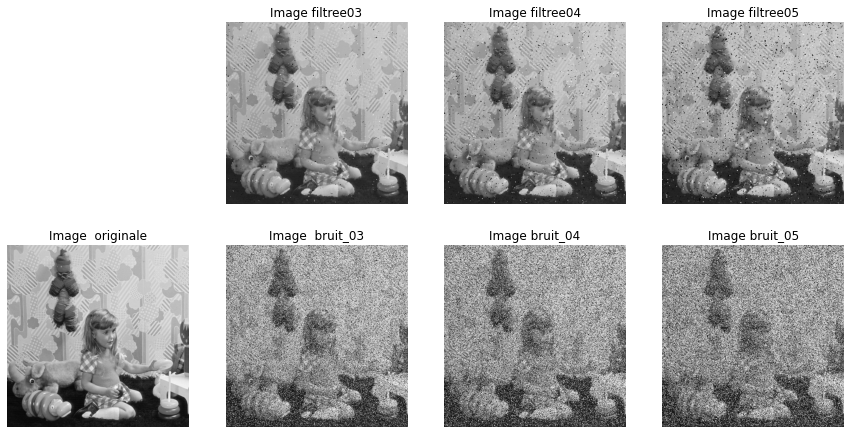

In [48]:
# On fait appela la fonction impulse avec differents taux de bruit : 0.3, 0.4 et 0.5 :
image_bruit_impulsionnel_matrice_03 = impulse(image_matrice , 0.3)
image_bruit_impulsionnel_03 = np.uint8(image_bruit_impulsionnel_matrice_03)
image_bruit_impulsionnel_matrice_04 = impulse(image_matrice , 0.4)
image_bruit_impulsionnel_04 = np.uint8(image_bruit_impulsionnel_matrice_04)
image_bruit_impulsionnel_matrice_05 = impulse(image_matrice , 0.5)
image_bruit_impulsionnel_05 = np.uint8(image_bruit_impulsionnel_matrice_05)

# filtrage de les images bruitees :

image_fil_median_303 = cv.medianBlur(image_bruit_impulsionnel_03, 3)
image_fil_median_304 = cv.medianBlur(image_bruit_impulsionnel_04, 3)
image_fil_median_305 = cv.medianBlur(image_bruit_impulsionnel_05, 3)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruit_03")
plt.imshow(image_bruit_impulsionnel_03, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image bruit_04")
plt.imshow(image_bruit_impulsionnel_04, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image bruit_05")
plt.imshow(image_bruit_impulsionnel_05, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,2)
plt.title("Image filtree03")
plt.imshow(image_fil_median_303, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,3)
plt.title("Image filtree04")
plt.imshow(image_fil_median_304, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,4)
plt.title("Image filtree05")
plt.imshow(image_fil_median_305, cmap = "gray")
plt.axis('off')

plt.show()





## Commentaire :
Le pourcentage de bruit poivre et sel dans une image affecte le choix de la taille du noyau du filtre median de la manière suivante :

- Pourcentage élevé de bruit sel et poivre : Une taille de noyau plus grande est généralement nécessaire pour supprimer efficacement le bruit. En effet, une taille de noyau plus grande couvre plus de pixels, ce qui augmente les chances de trouver un pixel non bruyant dans la zone environnante pour remplacer le pixel bruyant.

- Faible pourcentage de bruit sel et poivre : Une taille de noyau plus petite peut être utilisée car il y a moins de bruit à supprimer. Une taille de noyau plus petite peut également aider à préserver les détails qui peuvent être flous par une taille de noyau plus grande.

En général, le choix de la taille du noyau dépend du compromis souhaité entre la réduction du bruit et la préservation des détails. Une taille de noyau plus grande peut être nécessaire pour des niveaux plus élevés de bruit sel et poivre, mais peut également entraîner un plus grand flou. Une taille de noyau plus petite peut mieux préserver les détails, mais peut ne pas éliminer efficacement les niveaux élevés de bruit poivre et sel.

On va essayer une taille superieure du masque = 7 :

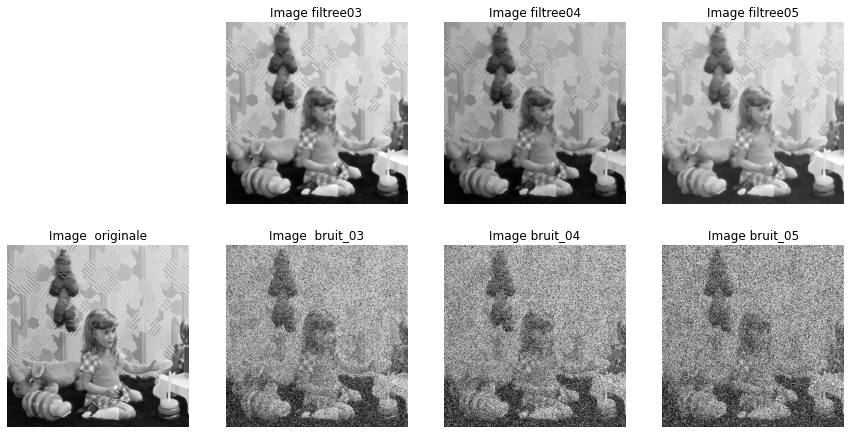

In [49]:
image_bruit_impulsionnel_matrice_03 = impulse(image_matrice , 0.3)
image_bruit_impulsionnel_03 = np.uint8(image_bruit_impulsionnel_matrice_03)
image_bruit_impulsionnel_matrice_04 = impulse(image_matrice , 0.4)
image_bruit_impulsionnel_04 = np.uint8(image_bruit_impulsionnel_matrice_04)
image_bruit_impulsionnel_matrice_05 = impulse(image_matrice , 0.5)
image_bruit_impulsionnel_05 = np.uint8(image_bruit_impulsionnel_matrice_05)

# filtrage de les images bruitees :

image_fil_median_703 = cv.medianBlur(image_bruit_impulsionnel_03, 7)
image_fil_median_704 = cv.medianBlur(image_bruit_impulsionnel_04, 7)
image_fil_median_705 = cv.medianBlur(image_bruit_impulsionnel_05, 7)


#Affichage
fig=plt.figure(figsize=(15, 15))

fig.add_subplot(1,4,1)
plt.title("Image  originale")
plt.imshow(image, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,2)
plt.title("Image  bruit_03")
plt.imshow(image_bruit_impulsionnel_03, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,3)
plt.title("Image bruit_04")
plt.imshow(image_bruit_impulsionnel_04, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,4,4)
plt.title("Image bruit_05")
plt.imshow(image_bruit_impulsionnel_05, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,2)
plt.title("Image filtree03")
plt.imshow(image_fil_median_703, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,3)
plt.title("Image filtree04")
plt.imshow(image_fil_median_704, cmap = "gray")
plt.axis('off')

fig.add_subplot(2,4,4)
plt.title("Image filtree05")
plt.imshow(image_fil_median_705, cmap = "gray")
plt.axis('off')

plt.show()



## Commentaires :
- Dans ce cas, on a pu supprimer le bruit mais avec un max de flou, ceci confirme les resultats obtenus avant. Augmenter le pourcentage de bruit nous mene a augmenter la taille du masque mais ceci sera limite dans le cas de bruit superieur a 40%.


# Manip2:

## Lecture et affichage de l'image :

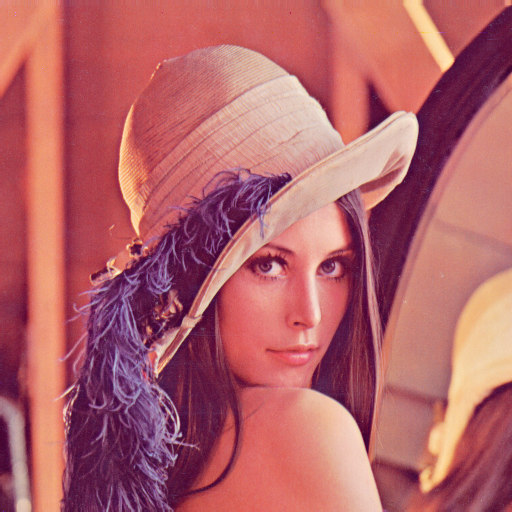

In [50]:
image = Image.open('lena.png')
image

## Transformation en NG :

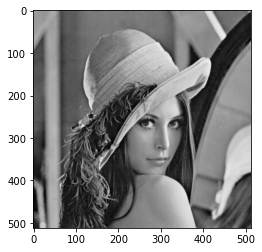

In [51]:
imageGray =image.convert('L')
plt.imshow(imageGray, cmap ="gray")
plt.show()

Calcul et affichage des gradients, sobel, prewitt et laplacien ainsi que leurs parametres :

# Classique :

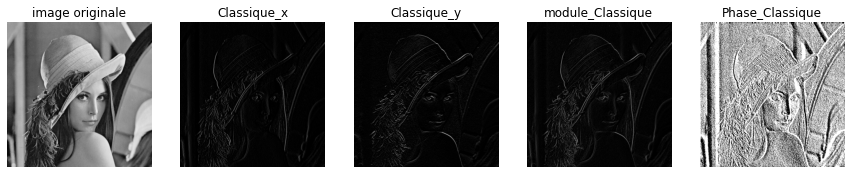

In [52]:
# calcul du masque de convolution :
hy = np.array([[-1], [1]])
hx = hy.T

imageGray_matrice = np.array(imageGray)
#calcul de gradient suivant x et y :
GradientX = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=hx)
GradientY = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=hy)

# Le module et la Phase
GradientModule_list = []
GradientPhase_list = []
for i in range(imageGray_matrice.shape[0]):
    for j in range(imageGray_matrice.shape[1]) :
        GradientModule_list.append(np.sqrt(GradientX[i][j] ** 2 + GradientY[i][j] ** 2))
        if (GradientX[i][j].any()==0) :
            GradientPhase_list.append(math.pi / 2)
        else :
            GradientPhase_list.append(math.atan((GradientY[i][j]) / (GradientX[i][j])))
            
GradientModule = np.asarray(GradientModule_list).reshape(imageGray_matrice.shape[0], imageGray_matrice.shape[1])
GradientPhase = np.asarray(GradientPhase_list).reshape(imageGray_matrice.shape[0], imageGray_matrice.shape[1])
          
fig=plt.figure(figsize=(15, 15))
fig.add_subplot(1,5,1)
plt.title("image originale")
plt.imshow(imageGray, cmap ="gray")
plt.axis('off')

fig.add_subplot(1,5,2)
plt.title("Classique_x")
plt.imshow(GradientX, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,5,3)
plt.title("Classique_y")
plt.imshow(GradientY, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,5,4)
plt.title("module_Classique")
plt.imshow(GradientModule, cmap = "gray")
plt.axis('off')


fig.add_subplot(1,5,5)
plt.title("Phase_Classique")
plt.imshow(GradientPhase, cmap = "gray")
plt.axis('off')

plt.show()


## Prewitt :

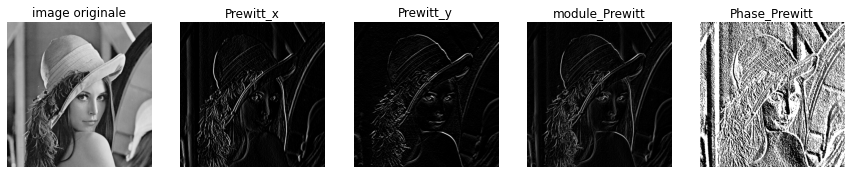

In [53]:
# calcul de masques de convolution :
PrewitX = np.array([[-1 ,0  , 1 ] , [-1 , 0 , 1] , [-1 , 0 , 1]])
PrewitY = PrewitX.T
# calcul de prewitt suivant x et y :
PrewitX = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=PrewitX)
PrewitY = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=PrewitY)

# Le module et la Phase
PrewitModule_list = []
PrewitPhase_list = []
for i in range(imageGray_matrice.shape[0]):
    for j in range(imageGray_matrice.shape[1]) :
        PrewitModule_list.append(np.sqrt(PrewitX[i][j] ** 2 + PrewitY[i][j] ** 2))
        if (PrewitX[i][j].any()==0) :
            PrewitPhase_list.append(math.pi / 2)
        else :
            PrewitPhase_list.append(math.atan((PrewitY[i][j]) / (PrewitX[i][j])))
            
PrewitModule = np.asarray(PrewitModule_list).reshape(imageGray_matrice.shape[0], imageGray_matrice.shape[1])
PrewitPhase = np.asarray(PrewitPhase_list).reshape(imageGray_matrice.shape[0], imageGray_matrice.shape[1])
          
fig=plt.figure(figsize=(15, 15))
fig.add_subplot(1,5,1)
plt.title("image originale")
plt.imshow(imageGray, cmap ="gray")
plt.axis('off')


fig.add_subplot(1,5,2)
plt.title("Prewitt_x")
plt.imshow(PrewitX, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,5,3)
plt.title("Prewitt_y")
plt.imshow(PrewitY, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,5,4)
plt.title("module_Prewitt")
plt.imshow(PrewitModule, cmap = "gray")
plt.axis('off')


fig.add_subplot(1,5,5)
plt.title("Phase_Prewitt")
plt.imshow(PrewitPhase, cmap = "gray")
plt.axis('off')




plt.show()

## Sobel :

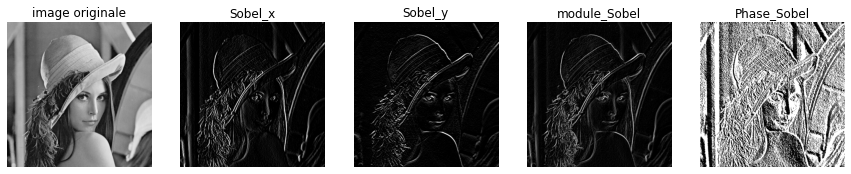

In [54]:
#calcul de masque de convolution :
SobelX = np.array([[-1 ,0  , 1 ] , [-2 , 0 , 2] , [-1 , 0 , 1]])
SobelY = SobelX.T
# calcul de sobel suivant x et y :
SobelX = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=SobelX)
SobelY = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=SobelY)

# Le module et la Phase
SobelModule_list = []
SobelPhase_list = []
for i in range(imageGray_matrice.shape[0]):
    for j in range(imageGray_matrice.shape[1]) :
        SobelModule_list.append(np.sqrt(SobelX[i][j] ** 2 + SobelY[i][j] ** 2))
        if (SobelX[i][j].any()==0) :
            SobelPhase_list.append(math.pi / 2)
        else :
            SobelPhase_list.append(math.atan((SobelY[i][j]) / (SobelX[i][j])))
            
SobelModule = np.asarray(SobelModule_list).reshape(imageGray_matrice.shape[0], imageGray_matrice.shape[1])
SobelPhase = np.asarray(SobelPhase_list).reshape(imageGray_matrice.shape[0], imageGray_matrice.shape[1])
          
fig=plt.figure(figsize=(15, 15))
fig.add_subplot(1,5,1)
plt.title("image originale")
plt.imshow(imageGray, cmap ="gray")
plt.axis('off')

fig.add_subplot(1,5,2)
plt.title("Sobel_x")
plt.imshow(SobelX, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,5,3)
plt.title("Sobel_y")
plt.imshow(SobelY, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,5,4)
plt.title("module_Sobel")
plt.imshow(SobelModule, cmap = "gray")
plt.axis('off')


fig.add_subplot(1,5,5)
plt.title("Phase_Sobel")
plt.imshow(SobelPhase, cmap = "gray")
plt.axis('off')

plt.show()

## La phase du gradient :
La phase de gradient (orientation) d'une image représente la direction des changements d'intensité dans l'image. En d'autres termes, elle fournit des informations sur les bords et les textures de l'image. La phase de gradient peut être utilisée pour détecter et décrire des caractéristiques importantes dans une image, telles que les coins, les lignes et les limites d'un objet. En capturant l'orientation des changements d'intensité, la phase de gradient fournit des informations précieuses sur la structure et le contenu d'une image.

## Comparaison :

On va faire une comparaison selon les modules :

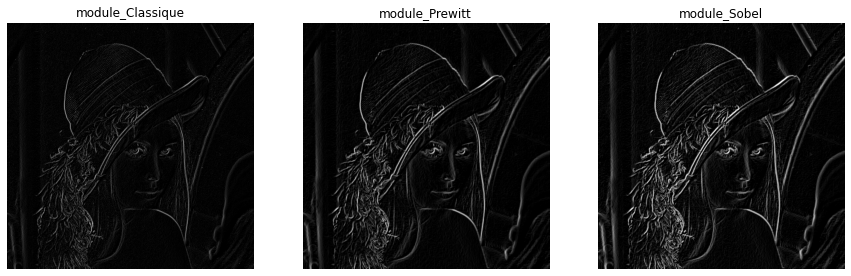

In [55]:
fig=plt.figure(figsize=(15, 15))
fig.add_subplot(1,3,1)
plt.title("module_Classique")
plt.imshow(GradientModule, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,2)
plt.title("module_Prewitt")
plt.imshow(PrewitModule, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,3,3)
plt.title("module_Sobel")
plt.imshow(SobelModule, cmap = "gray")
plt.axis('off')
plt.show()

Les principales différences entre les méthodes de détection des contours (classique, Prewitt et Sobel) sont les suivantes :

- Classique: C'est la plus simple des trois et la moins couteuse en termes de calcul. Elle fournit les résultats les plus rapides mais sa précision dans la detection des bords est faible(elle represente des contours tres fins)

- Prewitt : Il s'agit d'un détecteur de contours plus précis que le classique et il est couramment utilise dans le traitement des images. Il a un cout de calcul plus eleve que le classique mais fournit des resultats plus precis.(des contours plus epais que le classique avec une sorte de lissage Pour le filtre Prewitt (c = 1) la série [1 1 1] approxime une moyenne (a un facteur prêt 1/3)

- Sobel : Il est considere comme le detecteur de bords le plus precis des trois et est couramment utilise dans les applications de vision par ordinateur. Il fournit des resultats de la plus haute qualite, mais il a le plus grand cout de calcul, ce qui en fait le plus lent des trois.(des contours plus epais que le Prewitt avec une sorte de lissage Pour le filtre Sobel (c = 2) la série [1 2 1] approxime une gaussienne (a un facteur prêt 1/4) . 

Dans les deux cas il y a un filtrage passe-bas et donc un lissage dl’image).

Les trois detecteurs de contours sont utilises pour calculer l'amplitude du gradient d'une image et mettre en evidence les changements d'intensite, representant la presence d'un contour. Le choix d'un detecteur de contour depend de la precision souhaitee et des ressources informatiques.

## Les laplacien 4-connexites, 8-connexites :

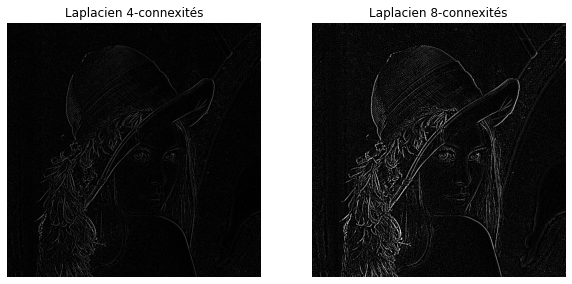

In [56]:
# On commence par les masques de convolution :
Laplacien_filter_4 = np.array([[0 ,-1  , 0 ] , [-1 , 4 , -1] , [0 , -1 , 0]])
Laplacien_filter_8 = np.array([[-1 ,-1  , -1 ] , [-1 , 8 , -1] , [-1 , -1 , -1]])

Laplacien_4 = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=Laplacien_filter_4)
Laplacien_8 = cv.filter2D(src=imageGray_matrice, ddepth=-1, kernel=Laplacien_filter_8)


fig=plt.figure(figsize=(10, 10))
fig.add_subplot(1,2,1)
plt.title("Laplacien 4-connexités")
plt.imshow(Laplacien_4, cmap = "gray")
plt.axis('off')


fig.add_subplot(1,2,2)
plt.title("Laplacien 8-connexités")
plt.imshow(Laplacien_8, cmap = "gray")
plt.axis('off')




plt.show()

## Commentaires :
- Dans le cas de la 4-connexité, le Laplacien considère la différence d'intensité entre un pixel et ses quatre voisins (au-dessus, au-dessous, à gauche et à droite) et produit un contour net entre l'objet et le fond. Cela est utile pour détecter les bords dans les images avec une séparation nette entre l'objet et le fond.

- Dans 8-connexity, le Laplacien prend en compte la différence d'intensité entre un pixel et ses huit voisins (voisins diagonaux inclus) et produit un résultat de détection des contours plus détaillé, avec des contours plus doux et plus lisses entre l'objet et le fond. Cela est utile pour les images présentant des objets plus complexes et des bords plus détaillés.

En résumé, le choix de la 4-connexité ou de la 8-connexité dans le Laplacien dépend du type d'image et du résultat souhaité pour la détection des contours.

## Application du filtre gaussien :
On va appliquer un filtre gaussien ideal, cad avec un masque de taille  = (7;7) et d'un ecart-type de 1 :

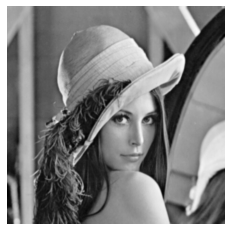

In [57]:
# taille du masque :
size = (7, 7)

imageGray_fil_gaussien_7_1 = cv.GaussianBlur(imageGray_matrice, size ,1 )

#Affichage
plt.imshow(imageGray_fil_gaussien_7_1, cmap = 'gray')
plt.axis('off')
plt.show()

On va appliquer le laplacien 8-connexites et puis comparer nos resultats :

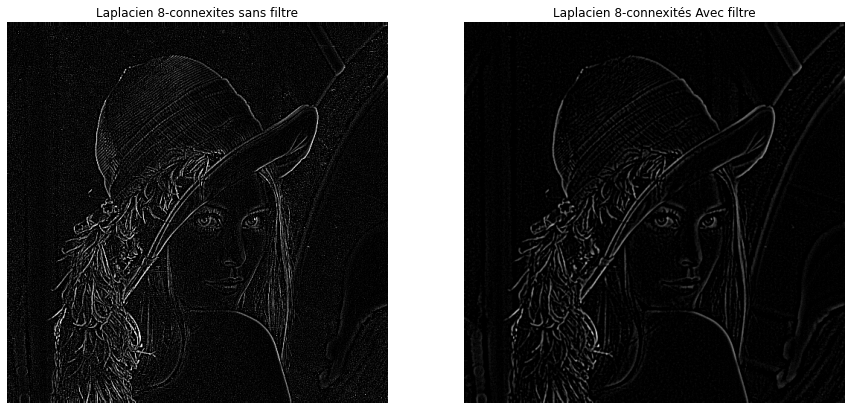

In [58]:
Laplacien_filter_gaussien_8 =np.array([[-1 ,-1  , -1 ] , [-1 , 8 , -1] , [-1 , -1 , -1]])
Laplacien_gaussien_8 = cv.filter2D(src=imageGray_fil_gaussien_7_1, ddepth=-1, kernel=Laplacien_filter_gaussien_8)



fig=plt.figure(figsize=(15, 15))
fig.add_subplot(1,2,1)
plt.title("Laplacien 8-connexites sans filtre")
plt.imshow(Laplacien_8, cmap = "gray")
plt.axis('off')


fig.add_subplot(1,2,2)
plt.title("Laplacien 8-connexités Avec filtre")
plt.imshow(Laplacien_gaussien_8, cmap = "gray")
plt.axis('off')

plt.show()

## Commentaires :
Lorsque le laplacien est utilise :  
- sans filtre gaussien : le Laplacien 8 connexité détecte les contours d'une image en mettant en évidence les changements brusques d'intensité. 
- Apres un filtre gaussien, ce dernier aide à lisser l'image et à réduire le bruit, ce qui permet d'obtenir une détection des contours plus claire et plus précise.

Passons aux comparaisons entre les filtres de detection de contours :

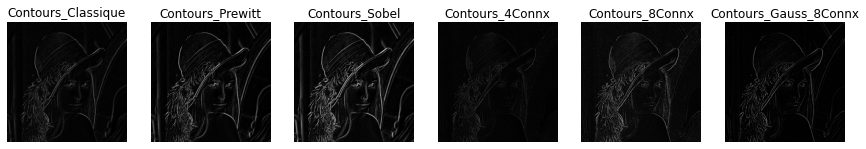

In [59]:
fig=plt.figure(figsize=(15, 15))
fig.add_subplot(1,6,1)
plt.title("Contours_Classique")
plt.imshow(GradientModule, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,6,2)
plt.title("Contours_Prewitt")
plt.imshow(PrewitModule, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,6,3)
plt.title("Contours_Sobel")
plt.imshow(SobelModule, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,6,4)
plt.title("Contours_4Connx")
plt.imshow(Laplacien_4, cmap = "gray")
plt.axis('off')


fig.add_subplot(1,6,5)
plt.title("Contours_8Connx")
plt.imshow(Laplacien_8, cmap = "gray")
plt.axis('off')

fig.add_subplot(1,6,6)
plt.title("Contours_Gauss_8Connx")
plt.imshow(Laplacien_gaussien_8, cmap = "gray")
plt.axis('off')

plt.show()

## Comparaison, Commentaires et Conclusion :

La detection des contours est une etape importante du traitement des images, On a plusieurs filtres a utiliser :

- Filtre de Sobel(c=2) et Prewitt(c=1) : Le filtre de Sobel est un filtre derive du premier ordre qui calcule l'amplitude du gradient d'une image. Il peut etre applique dans les deux directions, horizontale et verticale. Le filtre de Sobel(Prewitt) est efficace pour detecter les contours des images avec une separation nette entre l'objet et le fond.(contours epais pour Prewitt et plus epais pour Sobel) + existence de lissage.

- Filtre laplacien : Le filtre laplacien est un filtre derive du second ordre qui calcule le gradient d'intensite d'une image. Il est sensible à la fois aux contours et au bruit, et le choix de 4-connexité ou 8-connexité affecte la netteté et le détail du résultat de la détection des bords.(4-connexites : plus fin, 8_connexites : plus doux) et generalement, on utilise un filtre gaussien avant d'appliquer le laplacien 8-connexites pour un meilleur resultat.

- Filtre de Roberts(Classique) : Le filtre de Roberts est un filtre dérivé du premier ordre qui calcule la magnitude du gradient d'une image à l'aide d'un simple noyau de convolution en forme de croix. Il est rapide et efficace, mais moins précis que les filtres de Sobel(Prewitt).

Les contours obtenus à l'aide des filtres gradient et Laplacien sont d'une qualité moyenne et ne peuvent en règle générale être utilisés tels quel car ils sont bruités - épais - interrompus - non fermés. Ces défauts doivent être corrigés par des post-traitements. En résumé, le choix du filtre dépend du compromis souhaité entre l'efficacité du calcul, la tolérance au bruit et la précision des contours pour une tâche spécifique de traitement d'image.